### Importing libraries

In [4]:
# import pyspark.sql module
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from copy import copy

# Create SparkSession object
spark=SparkSession.builder\
                  .appName("Frauddetection")\
                  .getOrCreate()






### Importing Data

In [5]:
#import Data
fraud_detection_df=spark.read.csv("creditcard.csv",\
                                    header=True,\
                                    inferSchema=True)

# View the first five records
fraud_detection_df.show(2)

+----+----------------+-------------------+----------------+-----------------+------------------+-------------------+-------------------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+-----------------+------------------+------------------+------------------+------------------+-------------------+------------------+------------------+------------------+------------------+-----------------+------------------+--------------------+-------------------+------+-----+
|Time|              V1|                 V2|              V3|               V4|                V5|                 V6|                 V7|                V8|                V9|               V10|               V11|               V12|               V13|               V14|              V15|               V16|               V17|               V18|               V19|                V20|               V21|               V22|               V23|       

In [6]:
###Get the number of records 
print("The data contain %d records." % fraud_detection_df.count())

The data contain 35742 records.


In [7]:
###Get the number of columns 
print("The data contain %d columns." % len(fraud_detection_df.columns))

The data contain 31 columns.


In [8]:
# Select randomly  records
fraud_detection_df.select(fraud_detection_df.columns[:4]).sample(False, 0.5).show()

+----+------------------+-------------------+------------------+
|Time|                V1|                 V2|                V3|
+----+------------------+-------------------+------------------+
|   1|-0.966271711572087| -0.185226008082898|  1.79299333957872|
|   2| -1.15823309349523|  0.877736754848451|    1.548717846511|
|   2|-0.425965884412454|  0.960523044882985|  1.14110934232219|
|   4|  1.22965763450793|  0.141003507049326|0.0453707735899449|
|   9| -0.33826175242575|   1.11959337641566|  1.04436655157316|
|  10|  1.44904378114715|  -1.17633882535966| 0.913859832832795|
|  10|  0.38497821518095|  0.616109459176472|-0.874299702595052|
|  10|    1.249998742053|  -1.22163680921816| 0.383930151282291|
|  12|-0.752417042956605|  0.345485415344747|  2.05732291276727|
|  12|  1.10321543528383|-0.0402962145973447|   1.2673320885949|
|  14| -5.40125766315825|  -5.45014783420644|  1.18630463143652|
|  17| 0.962496069914852|   0.32846102605212| -0.17147905415064|
|  18| 0.247491127783665|

### Data Pre-processing

In [9]:
## print the schema of our data
fraud_detection_df.printSchema()

root
 |-- Time: integer (nullable = true)
 |-- V1: double (nullable = true)
 |-- V2: double (nullable = true)
 |-- V3: double (nullable = true)
 |-- V4: double (nullable = true)
 |-- V5: double (nullable = true)
 |-- V6: double (nullable = true)
 |-- V7: double (nullable = true)
 |-- V8: double (nullable = true)
 |-- V9: double (nullable = true)
 |-- V10: double (nullable = true)
 |-- V11: double (nullable = true)
 |-- V12: double (nullable = true)
 |-- V13: double (nullable = true)
 |-- V14: double (nullable = true)
 |-- V15: double (nullable = true)
 |-- V16: double (nullable = true)
 |-- V17: double (nullable = true)
 |-- V18: double (nullable = true)
 |-- V19: double (nullable = true)
 |-- V20: double (nullable = true)
 |-- V21: double (nullable = true)
 |-- V22: double (nullable = true)
 |-- V23: double (nullable = true)
 |-- V24: double (nullable = true)
 |-- V25: double (nullable = true)
 |-- V26: double (nullable = true)
 |-- V27: double (nullable = true)
 |-- V28: double (null

**Observation:**  all datatypes are numeric so there is no need for casting

### Looking at the data , you may find it only contains numerical variables.
 1. Features V1, V2, … V28 are the principal components obtained with PCA transformation. 
 2. The only features which have not been transformed are ‘Time’ and ‘Amount’.
 3.  ‘Time’ is the seconds elapsed between each transaction and the first. ‘Amount’ is the transaction amount.
 4.  ‘Class’ is the response variable with 1 as fraud and 0 otherwise.

In [10]:
print(fraud_detection_df.columns)

['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class']


In [11]:
#### missing values
fraud_detection_df.select([count(when(col(c).isNull(), c)).alias(c) for c in fraud_detection_df.columns]).show()


+----+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+------+-----+
|Time| V1| V2| V3| V4| V5| V6| V7| V8| V9|V10|V11|V12|V13|V14|V15|V16|V17|V18|V19|V20|V21|V22|V23|V24|V25|V26|V27|V28|Amount|Class|
+----+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+------+-----+
|   0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|     0|    0|
+----+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+------+-----+



**observation:** there is no missing values

### Explatory Data Analysis

#### exploring the target

In [12]:
fraud_detection_df.select("Class").show()

+-----+
|Class|
+-----+
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
|    0|
+-----+
only showing top 20 rows



In [13]:
target_count=fraud_detection_df.groupBy("Class").count()

In [14]:
target_count.show()

+-----+-----+
|Class|count|
+-----+-----+
|    1|  103|
|    0|35639|
+-----+-----+



In [15]:
target_count=target_count.withColumn("percentage",format_number((col("count")/fraud_detection_df.count())*100,2))

In [16]:
target_count.show()

+-----+-----+----------+
|Class|count|percentage|
+-----+-----+----------+
|    1|  103|      0.29|
|    0|35639|     99.71|
+-----+-----+----------+



**observation:** we have imbalanced dataset
0.17% of fraudulent transaction in front of 99% of non fraudulent
##### **insight**: we shoudn't use accuracy for evaluation

#### exploring variables

In [17]:

pandas_df=fraud_detection_df.toPandas()


In [18]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np
from matplotlib import style
import warnings
warnings.filterwarnings("ignore")

##### exploring Time

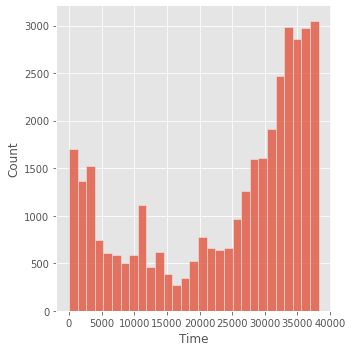

In [19]:
style.use("ggplot")
sns.displot(pandas_df["Time"])

we notice that the distributions has two similar pattern  after 10000 and before
and we have 100000 seconds is approximatively one Day 
so we have the same number of transactions on both days

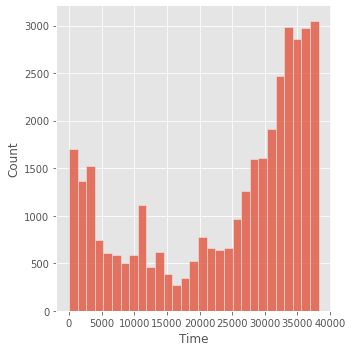

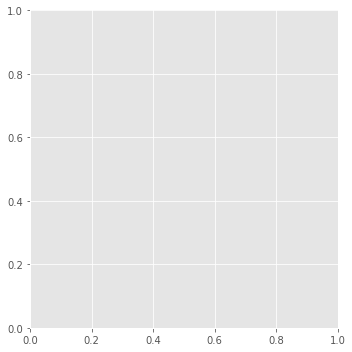

In [20]:
style.use("ggplot")
sns.displot(pandas_df["Time"][pandas_df["Time"]<100000])
plt.show()
sns.displot(pandas_df["Time"][pandas_df["Time"]>100000])
plt.show()

In [21]:
##### exploring Amount

In [22]:
fraud_detection_df.select("Amount").show()

+------+
|Amount|
+------+
|149.62|
|  2.69|
|378.66|
| 123.5|
| 69.99|
|  3.67|
|  4.99|
|  40.8|
|  93.2|
|  3.68|
|   7.8|
|  9.99|
| 121.5|
|  27.5|
|  58.8|
| 15.99|
| 12.99|
|  0.89|
|  46.8|
|   5.0|
+------+
only showing top 20 rows



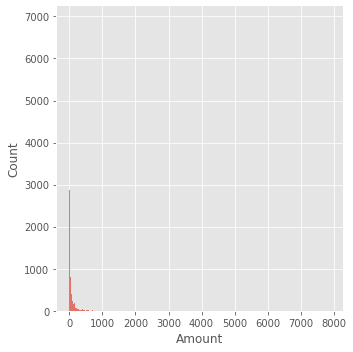

In [23]:
sns.displot(pandas_df["Amount"])

**observation:** may be there is a large gap between the values

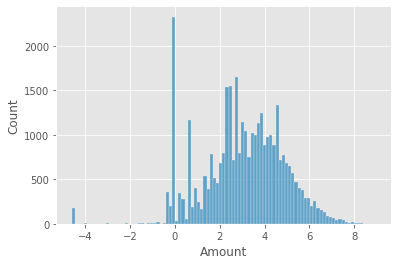

In [24]:
sns.histplot(np.log(pandas_df["Amount"]))

##### **observation** : we can say that it is near to be a normal distributions 
##### **insights** :we can conclude that Amount follows log-normal distributions

In [25]:
fraud_detection_df.select(mean("Amount")).show()

+-----------------+
|      avg(Amount)|
+-----------------+
|84.20133568350687|
+-----------------+



In [26]:
fraud_detection_df.select("Amount").describe().show()

+-------+-----------------+
|summary|           Amount|
+-------+-----------------+
|  count|            35742|
|   mean|84.20133568350687|
| stddev|227.2769997653882|
|    min|              0.0|
|    max|          7879.42|
+-------+-----------------+



**observation**:the previous plot of histogram show the large variance between values

##### exploring olthers variables:V1,V2,........,V28

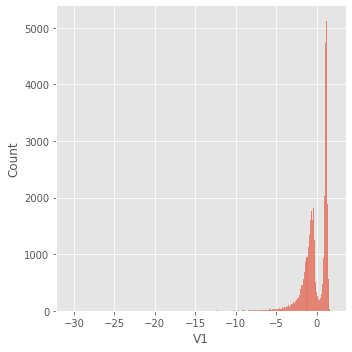

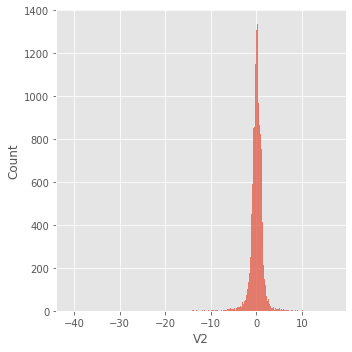

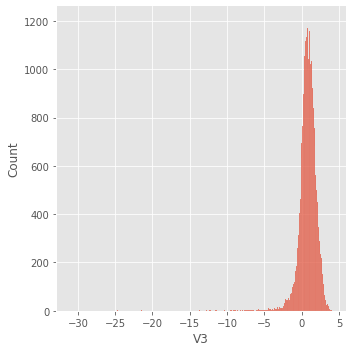

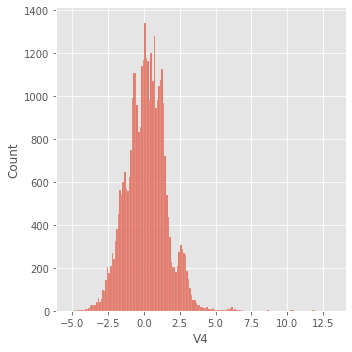

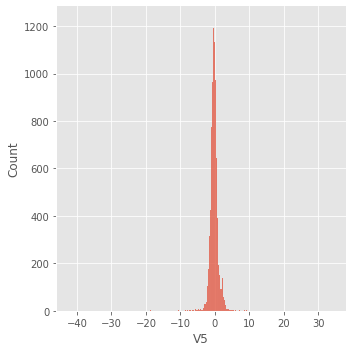

...

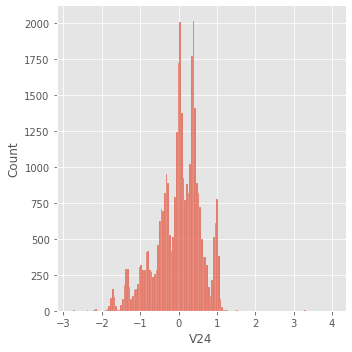

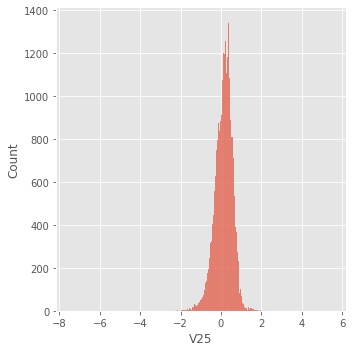

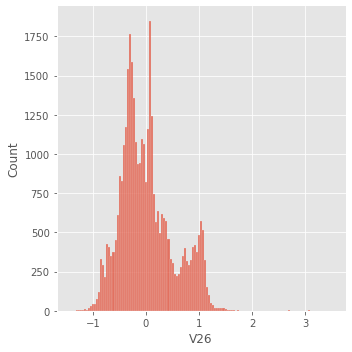

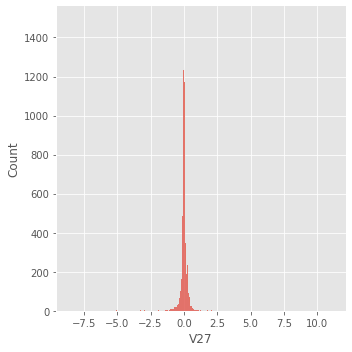

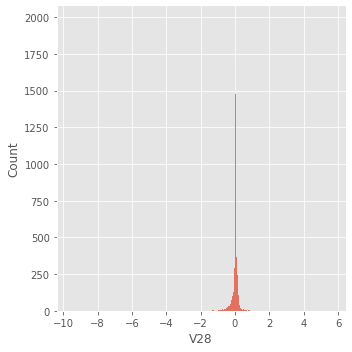

In [27]:
#### distribution of each Vs
for column in fraud_detection_df.columns[1:-2]:
    sns.displot(pandas_df[column])


**observation**: we notice that the variance are small and generally all of them follow normal distribution of mean 0

#### exploring variables grouping by Class:

In [28]:

df_1=pandas_df.loc[pandas_df["Class"]==1]
df_0=pandas_df.loc[pandas_df["Class"]==0].sample(df_1.shape[0])


In [29]:
df_0_concat_df_1=df_0.append(df_1)

In [30]:
df_0_concat_df_1.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
2612,2142,-0.924396,0.404559,1.808585,0.191153,1.031627,-0.635361,0.820051,-0.175261,-0.455334,...,0.186395,0.538009,-0.192023,0.079996,0.240756,-0.433986,-0.085974,-0.107589,25.00,0
9207,13208,1.047020,0.506178,1.301154,2.595547,-0.206458,0.442980,-0.414855,0.124229,0.402413,...,0.100971,0.552594,-0.025274,0.190661,0.312565,0.053981,0.003777,0.015784,15.17,0
15048,26393,1.056116,0.080344,-0.352795,0.912268,0.644012,0.338303,0.458909,-0.086602,-0.275232,...,-0.449902,-1.539797,-0.033955,-1.368766,0.351808,-0.738884,0.008731,0.035276,126.00,0
23725,32883,1.228164,0.212966,0.472349,1.146348,-0.512753,-0.851006,-0.034243,-0.125421,0.274095,...,0.155710,0.481743,-0.150253,0.394112,0.691554,-0.205973,0.020059,0.020960,5.76,0
31563,36415,1.208199,0.388296,0.259284,1.020907,-0.005395,-0.475053,0.206985,-0.040707,-0.383335,...,-0.444463,-1.384402,0.173939,-0.081966,0.257222,-0.833198,0.004874,0.015978,7.40,0


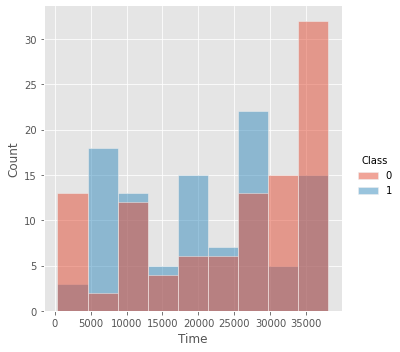

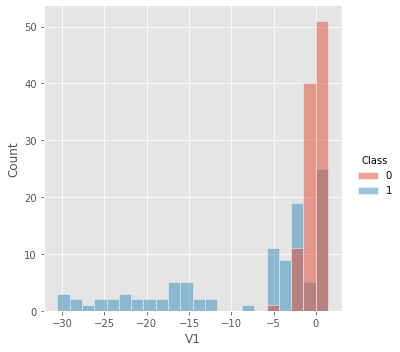

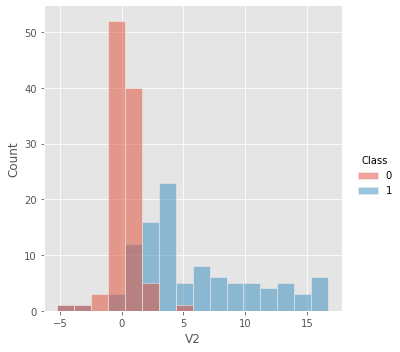

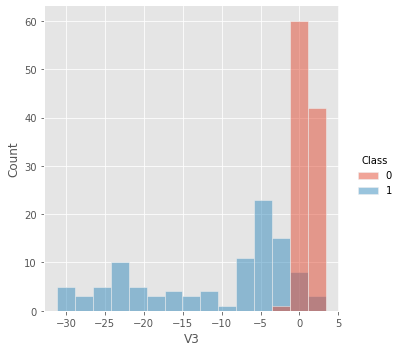

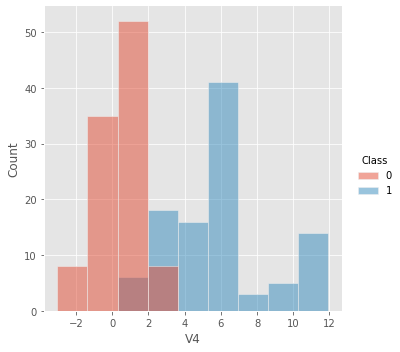

...

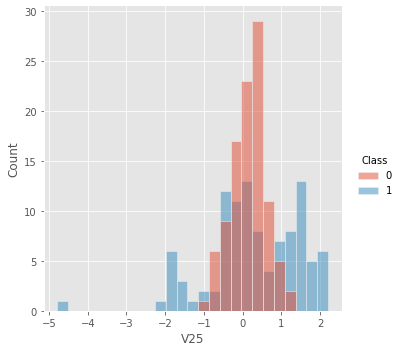

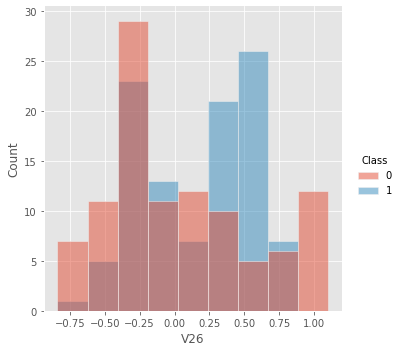

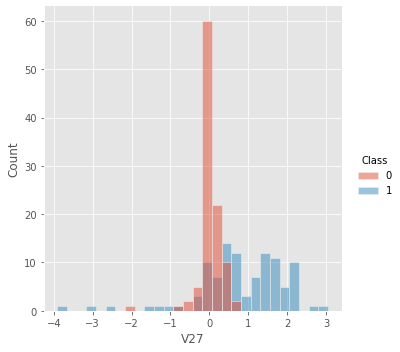

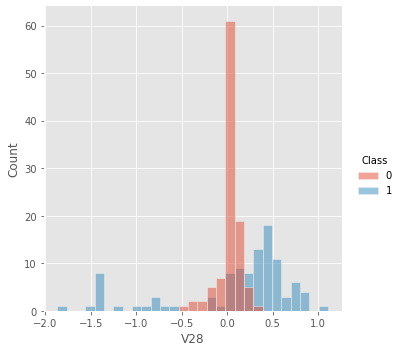

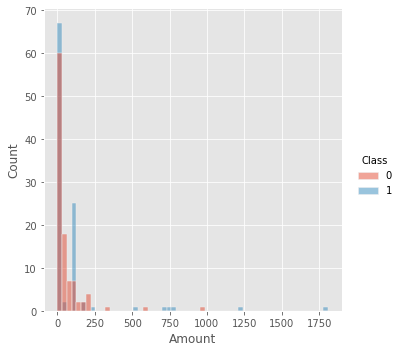

In [31]:
#### distribution of each Vs 
for column in fraud_detection_df.columns[:-1]:
   sns.displot(x=f"{column}",data=df_0_concat_df_1,hue="Class")


#### exploring the relation between variables

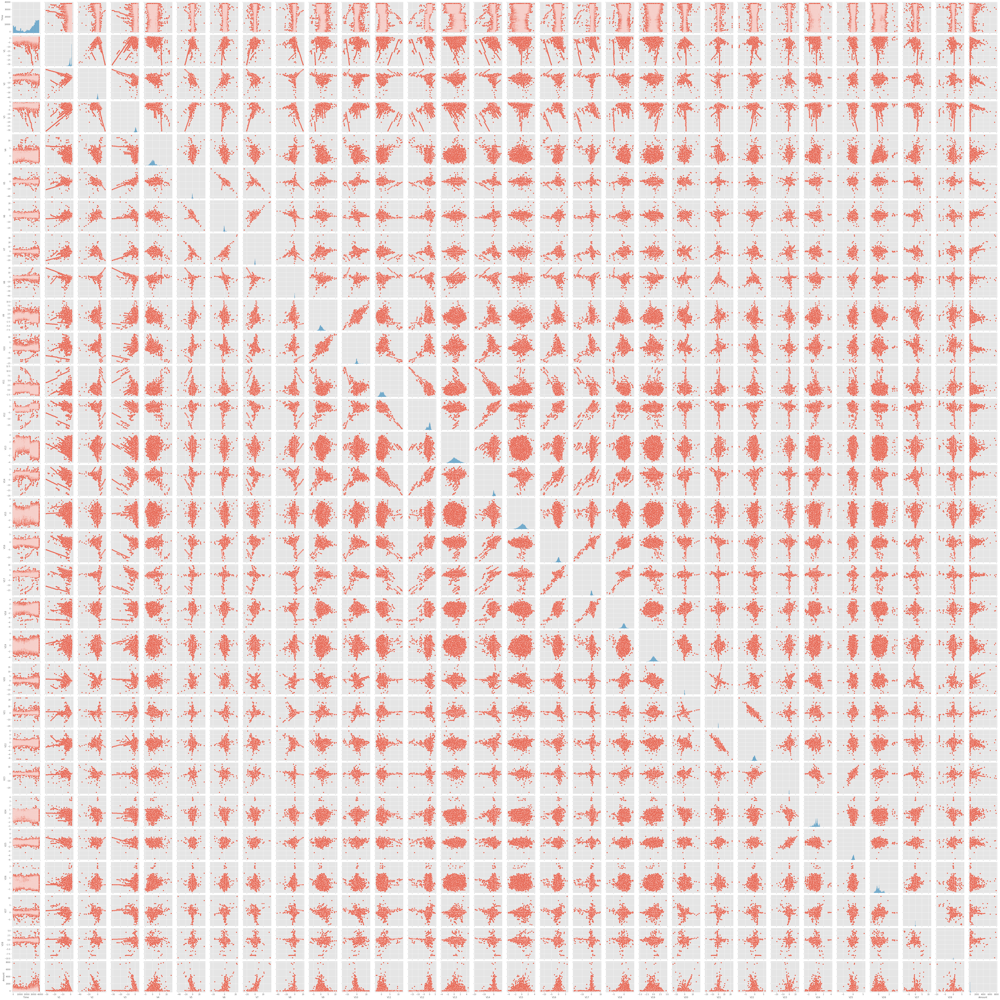

In [32]:
sns.pairplot(pandas_df.drop("Class",axis=1))

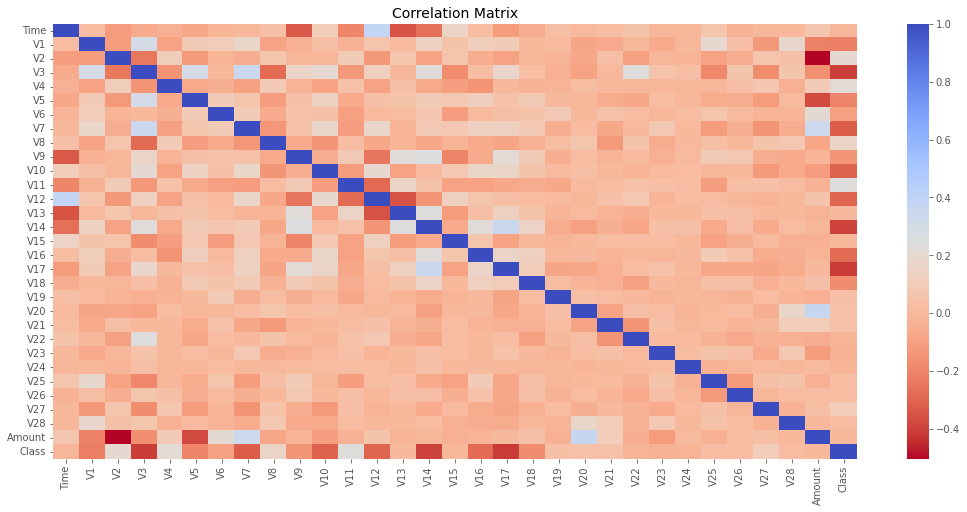

In [33]:
# we can check the important parameters that could effect our model.
f, ax = plt.subplots(figsize=(18,8))

sub_sample_corr = pandas_df.corr()
sns.heatmap(sub_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax)
ax.set_title('Correlation Matrix', fontsize=14)
plt.show()

#### Pre-Processing

In [34]:
#### Standardization
mean_Amount=pandas_df["Amount"].mean()
std_Amount=pandas_df["Amount"].std()
fraud_detection_df=fraud_detection_df.withColumn("Amount_standardiezd",(fraud_detection_df.Amount-mean_Amount)/std_Amount)


In [35]:
fraud_detection_df.select("Amount_standardiezd").show()

+--------------------+
| Amount_standardiezd|
+--------------------+
|  0.2878367119595045|
|-0.35864313488673083|
|  1.2955937671671662|
|  0.1729108724466503|
|-0.06252870153240132|
|-0.35433121594635575|
| -0.3485233251287077|
|-0.19096228711357338|
| 0.03959337867791057|
| -0.3542872167734948|
|-0.33615955755477506|
| -0.3265237386982226|
| 0.16411103787445627|
|-0.24948118701866373|
|-0.11176377596382699|
| -0.3001242349816405|
|-0.31332398683993157|
| -0.3665629860017055|
|-0.16456278339699124|
|-0.34847932595584674|
+--------------------+
only showing top 20 rows



In [36]:
fraud_detection_df=fraud_detection_df.drop("Amount")

In [37]:
print(fraud_detection_df.columns)

['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Class', 'Amount_standardiezd']


In [38]:
fraud_detection_df=fraud_detection_df.withColumnRenamed("Amount_standardiezd","Amount")

In [39]:
liste=fraud_detection_df.columns[:-2]
liste.append("Amount")



In [40]:
from pyspark.ml.feature import VectorAssembler
variables=fraud_detection_df.columns.append("Amount")
assembler=VectorAssembler(inputCols=liste,outputCol='features')
data=assembler.transform(fraud_detection_df)

In [41]:
data['features','Class'].show(5)

+--------------------+-----+
|            features|Class|
+--------------------+-----+
|[0.0,-1.359807133...|    0|
|[0.0,1.1918571113...|    0|
|[1.0,-1.358354061...|    0|
|[1.0,-0.966271711...|    0|
|[2.0,-1.158233093...|    0|
+--------------------+-----+
only showing top 5 rows



#### Split the Data to training sets and test sets:

In [42]:
(train, test )= data.randomSplit([0.8, 0.2], seed=23)

### Logistic Regression

In [43]:
from pyspark.ml.classification import LogisticRegression
#Create a Logistic Regression classifier.
logistic = LogisticRegression(labelCol = "Class", featuresCol = "features")
# Learn from the training data.
lrModel = logistic.fit(train)

In [44]:
prediction_LR = lrModel.transform(test)

In [45]:
prediction_LR.groupBy("Class", "prediction").count().show()

+-----+----------+-----+
|Class|prediction|count|
+-----+----------+-----+
|    1|       0.0|    8|
|    0|       0.0| 7098|
|    1|       1.0|   17|
|    0|       1.0|    4|
+-----+----------+-----+



In [46]:
tp = prediction_LR[(prediction_LR.Class == 1) & (prediction_LR.prediction == 1)].count()
tn = prediction_LR[(prediction_LR.Class == 0) & (prediction_LR.prediction == 0)].count()
fp = prediction_LR[(prediction_LR.Class == 0) & (prediction_LR.prediction == 1)].count()
fn = prediction_LR[(prediction_LR.Class == 1) & (prediction_LR.prediction == 0)].count()
recall_LR = tp/(tp+fn)
precision_LR = tp/(tp+fp)
f1_score_LR = 2*(recall_LR*precision_LR)/(recall_LR+precision_LR)
print("Recall : ",recall_LR)
print("Precision : ", precision_LR)
print("F1 Score : ", f1_score_LR)

Recall :  0.68
Precision :  0.8095238095238095
F1 Score :  0.7391304347826089


In [47]:
# Area under ROC curve
from pyspark.ml.evaluation import BinaryClassificationEvaluator
evaluator = BinaryClassificationEvaluator(labelCol="Class")
areaUnderROC_LR = evaluator.evaluate(prediction_LR, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC = %s" % areaUnderROC_LR)

Area under ROC = 0.980078851027874


In [49]:
 #Area under precision-recall curve
areaUnderPR_LR = evaluator.evaluate(prediction_LR, {evaluator.metricName: "areaUnderPR"})
print("Area under PR = %s" % areaUnderPR_LR)

Area under PR = 0.8367111087836894


In [59]:
results = {}
results['Logestic Regression'] = [recall_LR, precision_LR, f1_score_LR, areaUnderROC_LR, areaUnderPR_LR]
results

{'Logestic Regression': [0.68,
  0.8095238095238095,
  0.7391304347826089,
  0.980078851027874,
  0.8367111087836894]}

### Decision Tree

In [50]:
from pyspark.ml.classification import DecisionTreeClassifier

# Using the DecisionTree classifier model
dt = DecisionTreeClassifier(labelCol = "Class", featuresCol = "features", seed = 54321, maxDepth = 5)

dt_model = dt.fit(train)

In [51]:
# Make predictions.
prediction_DT = dt_model.transform(test)

In [52]:
# Select example rows to display.
prediction_DT.select('features', 'rawPrediction', 'probability', 'prediction').show(5)

+--------------------+-------------+--------------------+----------+
|            features|rawPrediction|         probability|prediction|
+--------------------+-------------+--------------------+----------+
|[0.0,-1.359807133...|[24280.0,1.0]|[0.99995881553478...|       0.0|
|[7.0,-0.894286082...|[24280.0,1.0]|[0.99995881553478...|       0.0|
|[7.0,-0.644269442...|[24280.0,1.0]|[0.99995881553478...|       0.0|
|[10.0,1.249998742...|[24280.0,1.0]|[0.99995881553478...|       0.0|
|[18.0,1.166616382...|[24280.0,1.0]|[0.99995881553478...|       0.0|
+--------------------+-------------+--------------------+----------+
only showing top 5 rows



In [53]:
prediction_DT.groupBy("Class", "prediction").count().show()

+-----+----------+-----+
|Class|prediction|count|
+-----+----------+-----+
|    1|       0.0|    3|
|    0|       0.0| 7097|
|    1|       1.0|   22|
|    0|       1.0|    5|
+-----+----------+-----+



In [55]:
tn = prediction_DT[(prediction_DT.Class == 0) & (prediction_DT.prediction == 0)].count()
tp = prediction_DT[(prediction_DT.Class == 1) & (prediction_DT.prediction == 1)].count()
fp = prediction_DT[(prediction_DT.Class == 0) & (prediction_DT.prediction == 1)].count()
fn = prediction_DT[(prediction_DT.Class == 1) & (prediction_DT.prediction == 0)].count()
recall_DT = tp/(tp+fn)
precision_DT = tp/(tp+fp)
f1_score_DT = 2*(recall_DT*precision_DT)/(recall_DT+precision_DT)
print("Recall : ",recall_DT)
print("Precision : ", precision_DT)
print("F1 Score : ", f1_score_DT)

Recall :  0.88
Precision :  0.8148148148148148
F1 Score :  0.8461538461538461


In [56]:
# Area under ROC curve
areaUnderROC_DT = evaluator.evaluate(prediction_DT, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC = %s" % areaUnderROC_DT)

Area under ROC = 0.900081667136018


In [57]:
# Area under precision-recall curve
areaUnderPR_DT = evaluator.evaluate(prediction_DT, {evaluator.metricName: "areaUnderPR"})
print("Area under PR = %s" % areaUnderPR_DT)

Area under PR = 0.8349549401721011


In [60]:
results['Decision Tree Classifier'] = [recall_DT, precision_DT, f1_score_DT, areaUnderROC_DT, areaUnderPR_DT]
results

{'Logestic Regression': [0.68,
  0.8095238095238095,
  0.7391304347826089,
  0.980078851027874,
  0.8367111087836894],
 'Decision Tree Classifier': [0.88,
  0.8148148148148148,
  0.8461538461538461,
  0.900081667136018,
  0.8349549401721011]}

### Random forest 

In [62]:
from pyspark.ml.classification import RandomForestClassifier

# Train a RandomForest model.
rf = RandomForestClassifier(labelCol="Class", featuresCol="features", numTrees=10)

rf_model = rf.fit(train)

In [63]:
# Make predictions.
prediction_RF = rf_model.transform(test)

In [64]:
prediction_RF.groupBy("Class", "prediction").count().show()

+-----+----------+-----+
|Class|prediction|count|
+-----+----------+-----+
|    1|       0.0|    3|
|    0|       0.0| 7100|
|    1|       1.0|   22|
|    0|       1.0|    2|
+-----+----------+-----+



In [65]:
tp = prediction_RF[(prediction_RF.Class == 1) & (prediction_RF.prediction == 1)].count()
tn = prediction_RF[(prediction_RF.Class == 0) & (prediction_RF.prediction == 0)].count()
fp = prediction_RF[(prediction_RF.Class == 0) & (prediction_RF.prediction == 1)].count()
fn = prediction_RF[(prediction_RF.Class == 1) & (prediction_RF.prediction == 0)].count()
recall_RF = tp/(tp+fn)
precision_RF = tp/(tp+fp)
f1_score_RF = 2*(recall_RF*precision_RF)/(recall_RF+precision_RF)
print("Recall : ",recall_RF)
print("Precision : ", precision_RF)
print("F1 Score : ", f1_score_RF)

Recall :  0.88
Precision :  0.9166666666666666
F1 Score :  0.8979591836734694


In [66]:
# Area under ROC curve
areaUnderROC_RF = evaluator.evaluate(prediction_RF, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC = %s" % areaUnderROC_RF)

Area under ROC = 0.9997071247535905


In [67]:
# Area under precision-recall curve
areaUnderPR_RF = evaluator.evaluate(prediction_RF, {evaluator.metricName: "areaUnderPR"})
print("Area under PR = %s" % areaUnderPR_RF)

Area under PR = 0.9209762519169706


In [68]:
results['Random Forest Classifier'] = [recall_RF, precision_RF, f1_score_RF, areaUnderROC_RF, areaUnderPR_RF]
results

{'Logestic Regression': [0.68,
  0.8095238095238095,
  0.7391304347826089,
  0.980078851027874,
  0.8367111087836894],
 'Decision Tree Classifier': [0.88,
  0.8148148148148148,
  0.8461538461538461,
  0.900081667136018,
  0.8349549401721011],
 'Random Forest Classifier': [0.88,
  0.9166666666666666,
  0.8979591836734694,
  0.9997071247535905,
  0.9209762519169706]}

### Gradient - Boosted Tree Classifier

In [69]:
from pyspark.ml.classification import GBTClassifier

# Train a GBT model.
gbt = GBTClassifier(labelCol="Class", featuresCol="features", maxIter=10)

# Train model. 
gbt_model = gbt.fit(train)

In [70]:
# Make predictions.
prediction_GBT = gbt_model.transform(test)

In [71]:
prediction_GBT.groupBy("Class", "prediction").count().show()

+-----+----------+-----+
|Class|prediction|count|
+-----+----------+-----+
|    1|       0.0|    3|
|    0|       0.0| 7098|
|    1|       1.0|   22|
|    0|       1.0|    4|
+-----+----------+-----+



In [72]:
tp = prediction_GBT[(prediction_GBT.Class == 1) & (prediction_GBT.prediction == 1)].count()
tn = prediction_GBT[(prediction_GBT.Class == 0) & (prediction_GBT.prediction == 0)].count()
fp = prediction_GBT[(prediction_GBT.Class == 0) & (prediction_GBT.prediction == 1)].count()
fn = prediction_GBT[(prediction_GBT.Class == 1) & (prediction_GBT.prediction == 0)].count()
recall_GBT = tp/(tp+fn)
precision_GBT = tp/(tp+fp)
f1_score_GBT = 2*(recall_GBT*precision_GBT)/(recall_GBT+precision_GBT)
print("Recall : ",recall_GBT)
print("Precision : ", precision_GBT)
print("F1 Score : ", f1_score_GBT)

Recall :  0.88
Precision :  0.8461538461538461
F1 Score :  0.8627450980392156


In [73]:
# Area under ROC curve
areaUnderROC_GBT = evaluator.evaluate(prediction_GBT, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC = %s" % areaUnderROC_GBT)

Area under ROC = 0.9935680090115461


In [74]:
# Area under precision-recall curve
areaUnderPR_GBT = evaluator.evaluate(prediction_GBT, {evaluator.metricName: "areaUnderPR"})
print("Area under PR = %s" % areaUnderPR_GBT)

Area under PR = 0.8185801418935603


In [75]:
results['Gradient-Boosted Tree Classifier'] = [recall_GBT, precision_GBT, f1_score_GBT, areaUnderROC_GBT, areaUnderPR_GBT]
results


{'Logestic Regression': [0.68,
  0.8095238095238095,
  0.7391304347826089,
  0.980078851027874,
  0.8367111087836894],
 'Decision Tree Classifier': [0.88,
  0.8148148148148148,
  0.8461538461538461,
  0.900081667136018,
  0.8349549401721011],
 'Random Forest Classifier': [0.88,
  0.9166666666666666,
  0.8979591836734694,
  0.9997071247535905,
  0.9209762519169706],
 'Gradient-Boosted Tree Classifier': [0.88,
  0.8461538461538461,
  0.8627450980392156,
  0.9935680090115461,
  0.8185801418935603]}

#### Conclusion

In [ ]:
import pandas as pd

In [78]:
results = pd.DataFrame.from_dict(results, orient='index',
                       columns=['Recall', 'Precision', 'F1 Score', 'Area Under ROC', 'Area Under PR'])

In [79]:
results

,Recall,Precision,F1 Score,Area Under ROC,Area Under PR
Logestic Regression,0.68,0.809524,0.739130,0.980079,0.836711
Decision Tree Classifier,0.88,0.814815,0.846154,0.900082,0.834955
Random Forest Classifier,0.88,0.916667,0.897959,0.999707,0.920976
Gradient-Boosted Tree Classifier,0.88,0.846154,0.862745,0.993568,0.818580


In [80]:
results.to_csv ('results.csv')